In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, DenseGCNConv, dense_diff_pool
import torch_explain as te
from torch_explain.logic.nn import entropy
from torch_explain.logic.metrics import test_explanation, complexity

import numpy as np
import pandas as pd
from pytorch_lightning.utilities.seed import seed_everything
from scipy.spatial.distance import cdist
from sympy import to_dnf, lambdify
from sklearn.metrics.cluster import homogeneity_score, completeness_score

import clustering_utils
import data_utils
import lens_utils
import model_utils
import persistence_utils
import visualisation_utils

In [3]:
# constants
DATASET_NAME = "BA_Community"
MODEL_NAME = f"GCN for {DATASET_NAME}"
NUM_CLASSES = 8

TRAIN_TEST_SPLIT = 0.8

NUM_HIDDEN_UNITS = 20
CLUSTER_ENCODING_SIZE = 20
EPOCHS = 10000
LR = 0.0001

NUM_NODES_VIEW = 5
NUM_EXPANSIONS = 2

LAYER_NUM = 5
LAYER_KEY = "conv5"

visualisation_utils.set_rc_params()

In [4]:
# model definition
class GCN(nn.Module):
    def __init__(self, num_in_features, num_hidden_features, cluster_encoding_size, num_classes):
        super(GCN, self).__init__()
        
        self.conv0 = GCNConv(num_in_features, num_hidden_features)
        self.conv1 = GCNConv(num_hidden_features, num_hidden_features)
        self.conv2 = GCNConv(num_hidden_features, num_hidden_features)
        self.conv3 = GCNConv(num_hidden_features, num_hidden_features)
        self.conv4 = GCNConv(num_hidden_features, num_hidden_features)
        self.conv5 = GCNConv(num_hidden_features, cluster_encoding_size)

        # linear layers
        self.lens = torch.nn.Sequential(te.nn.EntropyLinear(cluster_encoding_size, num_hidden_features, n_classes=num_classes),
                                        nn.LeakyReLU(),
                                        nn.Linear(num_hidden_features, 1))

    def forward(self, x, edge_index):
        x = self.conv0(x, edge_index)
        x = F.leaky_relu(x)

        x = self.conv1(x, edge_index)
        x = F.leaky_relu(x)

        x = self.conv2(x, edge_index)
        x = F.leaky_relu(x)
        
        x = self.conv3(x, edge_index)
        x = F.leaky_relu(x)
        
        x = self.conv4(x, edge_index)
        x = F.leaky_relu(x)
        
        x = self.conv5(x, edge_index)
        x = F.leaky_relu(x)
                        
        self.gnn_embedding = x
        
        x = F.softmax(x, dim=-1)
        x = torch.div(x, torch.max(x, dim=-1)[0].unsqueeze(1))
        concepts = x
        
        x = self.lens(x)
                
        return concepts, x.squeeze(-1)

In [5]:
def run_experiment(data, seed, path):
    config = {'seed': seed,
                       'dataset_name': DATASET_NAME,
                       'model_name': MODEL_NAME,
                       'num_classes': NUM_CLASSES,
                       'train_test_split': TRAIN_TEST_SPLIT,
                       'num_hidden_units': NUM_HIDDEN_UNITS,
                       'cluster_encoding_size': CLUSTER_ENCODING_SIZE,
                       'epochs': EPOCHS,
                       'lr': LR,
                       'num_nodes_view': NUM_NODES_VIEW,
                       'num_expansions': NUM_EXPANSIONS,
                       'layer_num': LAYER_NUM,
                       'layer_key': LAYER_KEY
                      }
    persistence_utils.persist_experiment(config, path, 'config.z')
    persistence_utils.persist_experiment(data, path,'data.z')

    # model training
    model = GCN(data["x"].shape[1], NUM_HIDDEN_UNITS, CLUSTER_ENCODING_SIZE, NUM_CLASSES)
    
    # register hooks to track activation
    model = model_utils.register_hooks(model)

    # train 
    train_acc, test_acc, train_loss, test_loss = model_utils.train(model, data, EPOCHS, LR)
    persistence_utils.persist_model(model, path, 'model.z')
        
    visualisation_utils.plot_model_accuracy(train_acc, test_acc, MODEL_NAME, path)
    visualisation_utils.plot_model_loss(train_loss, test_loss, MODEL_NAME, path)
    
    x = data["x"]
    edges = data['edges']
    edges_t = data['edge_list'].numpy()
    y = data["y"]
    train_mask = data["train_mask"]
    test_mask = data["test_mask"]
    
    # get model activations for complete dataset
    concepts, _ = model(x, edges)
    activation = torch.squeeze(model_utils.activation_list[LAYER_KEY]).detach().numpy()
    persistence_utils.persist_experiment(concepts, path, 'concepts.z')
    persistence_utils.persist_experiment(model_utils.activation_list, path, 'activation_list.z')


    # find centroids
    centroids, centroid_labels, used_centroid_labels = clustering_utils.find_centroids(activation, concepts, y)
    print(f"Number of cenroids: {len(centroids)}")
    persistence_utils.persist_experiment(centroids, path, 'centroids.z')
    persistence_utils.persist_experiment(centroid_labels, path, 'centroid_labels.z')
    persistence_utils.persist_experiment(used_centroid_labels, path, 'used_centroid_labels.z')
    
    # plot concept heatmaps
    visualisation_utils.plot_concept_heatmap(centroids, concepts, y, used_centroid_labels, MODEL_NAME, LAYER_NUM, path)
    
    # concept alignment
    homogeneity = homogeneity_score(y, used_centroid_labels)
    print(f"Concept homogeneity score: {homogeneity}")

    # clustering efficency
    completeness = completeness_score(y, used_centroid_labels)
    print(f"Concept completeness score: {completeness}")
    
    # calculate cluster sizing
    cluster_counts = visualisation_utils.print_cluster_counts(used_centroid_labels)
    concept_metrics = [('homogeneity', homogeneity), ('completeness', completeness), ('cluster_count', cluster_counts)]
    persistence_utils.persist_experiment(concept_metrics, path, 'concept_metrics.z')
    
    # generate explanations
    explanations = lens_utils.explain_classes(model, concepts, y, train_mask, test_mask, max_minterm_complexity=10, topk_explanations=3)
    persistence_utils.persist_experiment(explanations, path, 'explanations.z')

    # plot clustering
    visualisation_utils.plot_clustering(seed, activation, y, centroids, centroid_labels, used_centroid_labels, MODEL_NAME, LAYER_NUM, path)

    # plot samples
    sample_graphs, sample_feat = visualisation_utils.plot_samples(None, activation, y, LAYER_NUM, len(centroids), "Differential Clustering", "Raw", NUM_NODES_VIEW, edges_t, NUM_EXPANSIONS, path, concepts=centroids)
    persistence_utils.persist_experiment(sample_graphs, path, 'sample_graphs.z')
    persistence_utils.persist_experiment(sample_feat, path, 'sample_feat.z')
    
    # clean up
    plt.close()

Global seed set to 42


Task: Node Classification
Number of features:  1400
Number of labels:  1400
Number of classes:  1400
Number of edges:  2

START EXPERIMENT-----------------------------------------



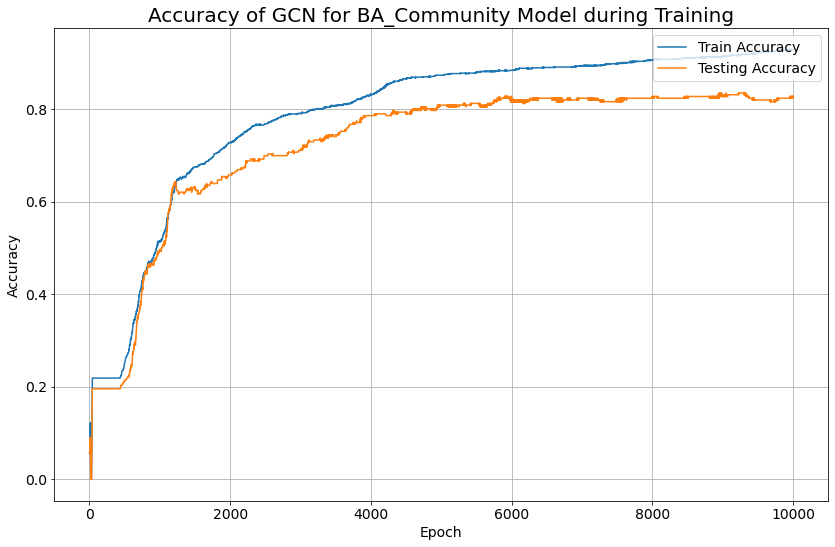

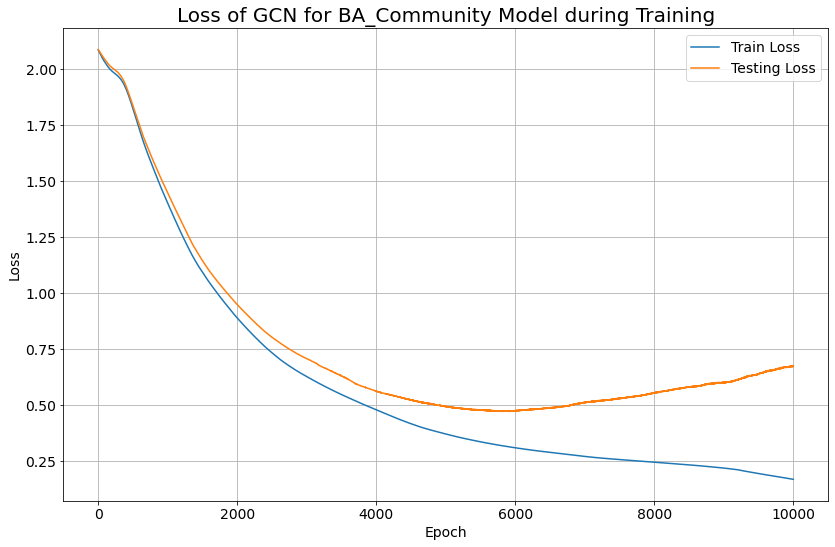

Number of cenroids: 39


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/utils.py:95: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  fig.canvas.draw()
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/src/visualisation_utils.py:87: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.savefig(os.path.join(path, f"concept_heatmap_layer{layer_num}.png"))


Concept homogeneity score: 0.8737383324176035
Concept completeness score: 0.7680024110266891
Cluster sizes by cluster id:
	Cluster 0: 1
	Cluster 1: 284
	Cluster 2: 198
	Cluster 3: 19
	Cluster 4: 108
	Cluster 5: 290
	Cluster 6: 15
	Cluster 7: 1
	Cluster 8: 1
	Cluster 9: 15
	Cluster 10: 48
	Cluster 11: 2
	Cluster 12: 168
	Cluster 13: 1
	Cluster 14: 1
	Cluster 15: 3
	Cluster 16: 1
	Cluster 17: 1
	Cluster 18: 1
	Cluster 19: 139
	Cluster 20: 1
	Cluster 21: 1
	Cluster 22: 1
	Cluster 23: 1
	Cluster 24: 16
	Cluster 25: 1
	Cluster 26: 1
	Cluster 27: 2
	Cluster 28: 1
	Cluster 29: 2
	Cluster 30: 1
	Cluster 31: 1
	Cluster 32: 3
	Cluster 33: 5
	Cluster 34: 1
	Cluster 35: 1
	Cluster 36: 62
	Cluster 37: 1
	Cluster 38: 1
Explanation class 0: feature0000000015 - acc. = 0.9656 - compl. = 1.0000
Explanation class 1: feature0000000000 & ~feature0000000002 & ~feature0000000015 - acc. = 0.8723 - compl. = 3.0000
Explanation class 2: feature0000000009 & ~feature0000000000 & ~feature0000000004 & ~feature000000

/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword a

<Figure size 1080x360 with 0 Axes>

/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:132: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


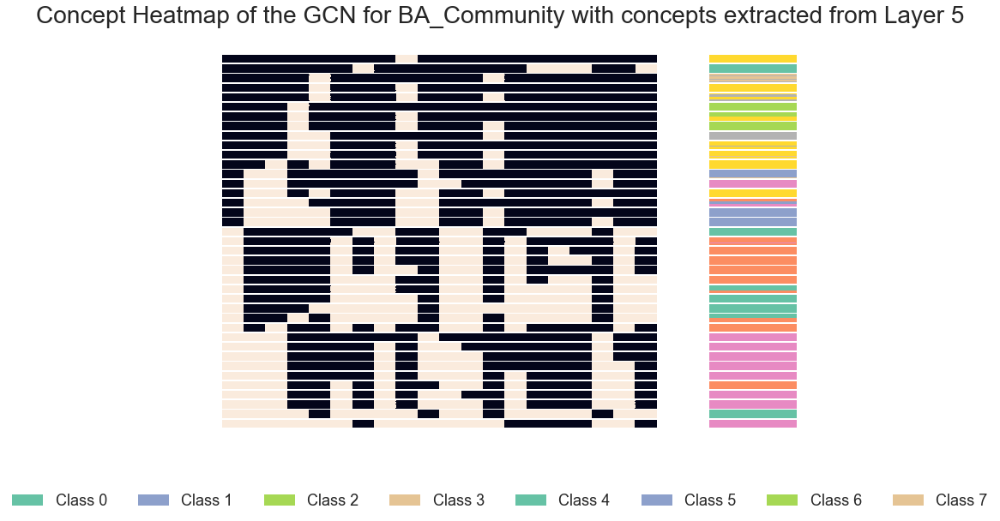

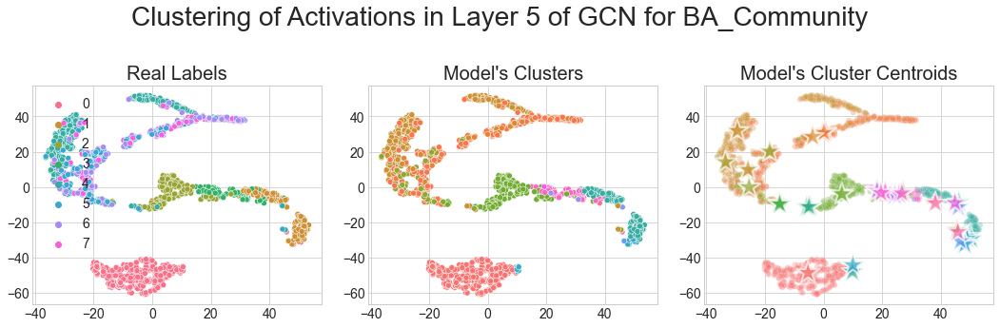

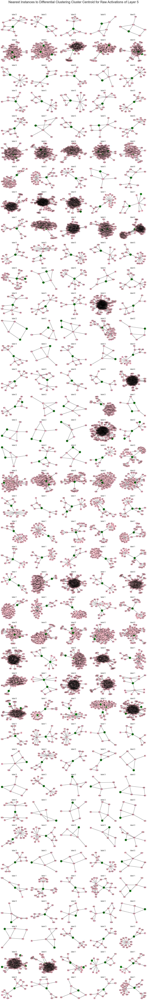

Global seed set to 19



END EXPERIMENT-------------------------------------------


START EXPERIMENT-----------------------------------------



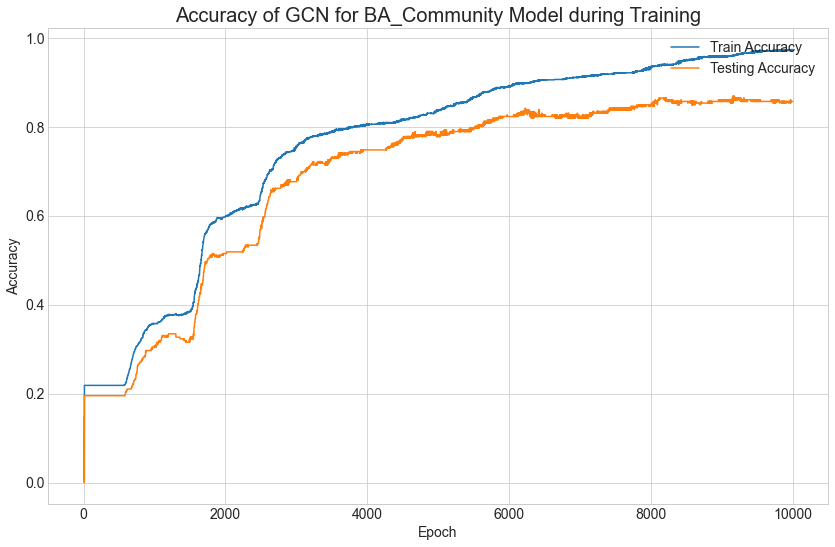

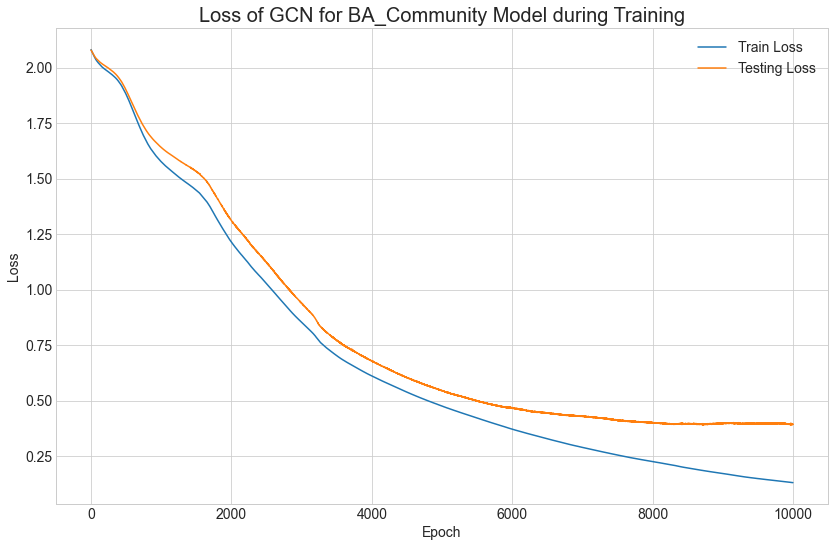

Number of cenroids: 78


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/utils.py:95: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  fig.canvas.draw()
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/src/visualisation_utils.py:87: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.savefig(os.path.join(path, f"concept_heatmap_layer{layer_num}.png"))


Concept homogeneity score: 0.841483309562961
Concept completeness score: 0.6362127611568547
Cluster sizes by cluster id:
	Cluster 0: 185
	Cluster 1: 3
	Cluster 2: 1
	Cluster 3: 9
	Cluster 4: 2
	Cluster 5: 29
	Cluster 6: 121
	Cluster 7: 8
	Cluster 8: 2
	Cluster 9: 1
	Cluster 10: 1
	Cluster 11: 2
	Cluster 12: 2
	Cluster 13: 1
	Cluster 14: 1
	Cluster 15: 14
	Cluster 16: 10
	Cluster 17: 2
	Cluster 18: 288
	Cluster 19: 19
	Cluster 20: 1
	Cluster 21: 1
	Cluster 22: 2
	Cluster 23: 11
	Cluster 24: 1
	Cluster 25: 1
	Cluster 26: 4
	Cluster 27: 6
	Cluster 28: 1
	Cluster 29: 1
	Cluster 30: 75
	Cluster 31: 59
	Cluster 32: 1
	Cluster 33: 3
	Cluster 34: 3
	Cluster 35: 3
	Cluster 36: 1
	Cluster 37: 4
	Cluster 38: 1
	Cluster 39: 1
	Cluster 40: 5
	Cluster 41: 1
	Cluster 42: 1
	Cluster 43: 1
	Cluster 44: 3
	Cluster 45: 1
	Cluster 46: 4
	Cluster 47: 1
	Cluster 48: 4
	Cluster 49: 1
	Cluster 50: 1
	Cluster 51: 5
	Cluster 52: 1
	Cluster 53: 1
	Cluster 54: 3
	Cluster 55: 1
	Cluster 56: 1
	Cluster 57: 1
	Clust

/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword a

<Figure size 1080x360 with 0 Axes>

/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:132: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


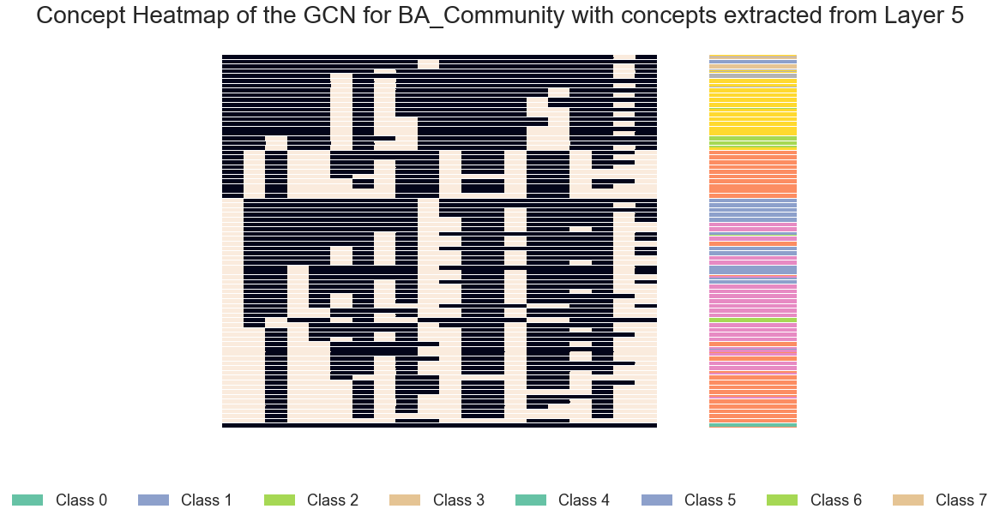

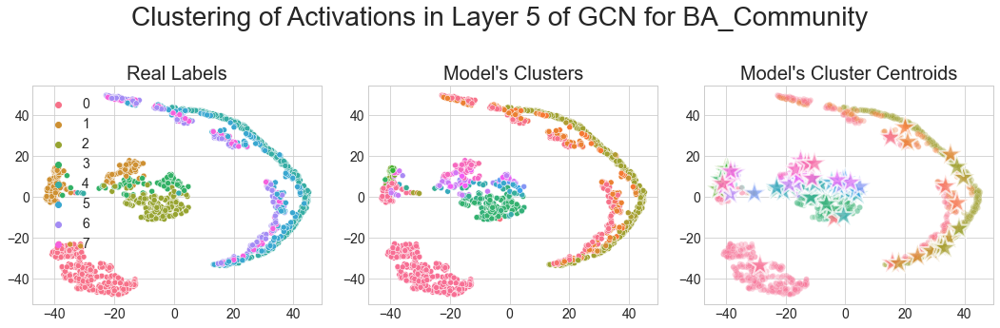

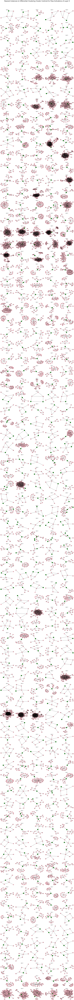

Global seed set to 76



END EXPERIMENT-------------------------------------------


START EXPERIMENT-----------------------------------------



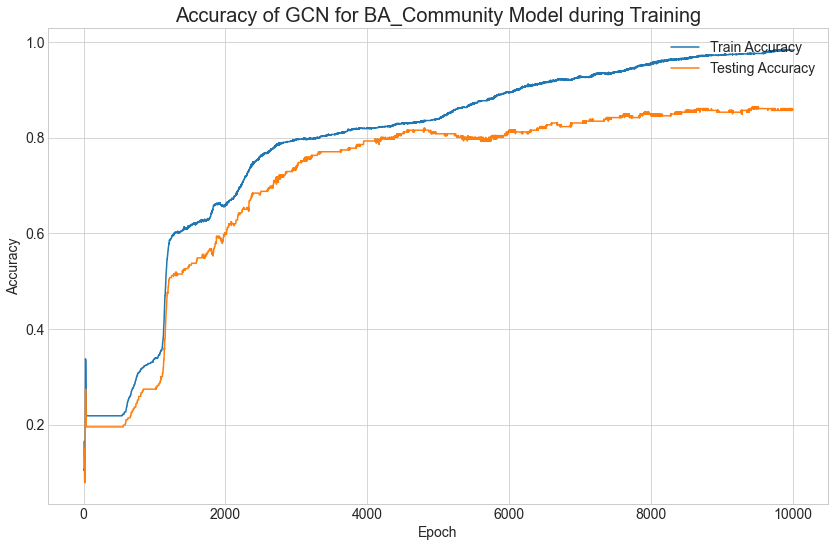

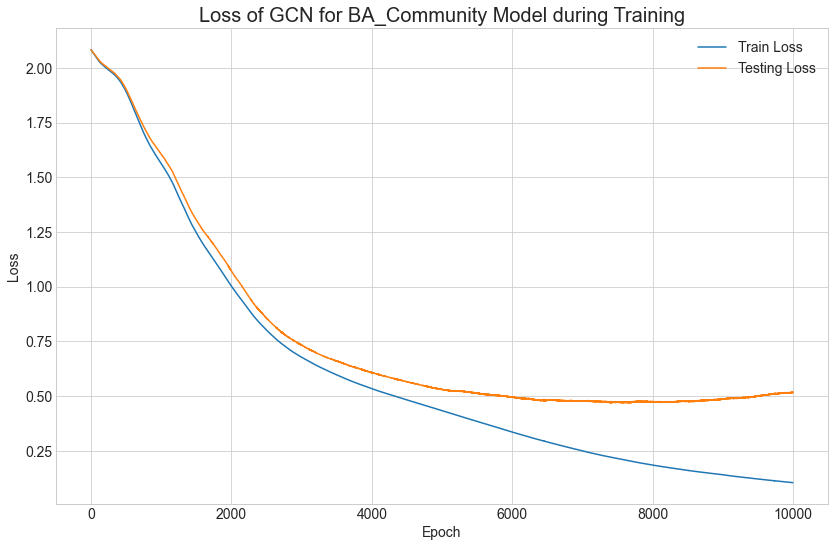

Number of cenroids: 106


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/utils.py:95: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  fig.canvas.draw()
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/src/visualisation_utils.py:87: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.savefig(os.path.join(path, f"concept_heatmap_layer{layer_num}.png"))


Concept homogeneity score: 0.9057319264768393
Concept completeness score: 0.545082844189228
Cluster sizes by cluster id:
	Cluster 0: 168
	Cluster 1: 8
	Cluster 2: 1
	Cluster 3: 3
	Cluster 4: 3
	Cluster 5: 1
	Cluster 6: 2
	Cluster 7: 1
	Cluster 8: 28
	Cluster 9: 21
	Cluster 10: 53
	Cluster 11: 3
	Cluster 12: 77
	Cluster 13: 1
	Cluster 14: 1
	Cluster 15: 1
	Cluster 16: 1
	Cluster 17: 1
	Cluster 18: 3
	Cluster 19: 1
	Cluster 20: 3
	Cluster 21: 1
	Cluster 22: 1
	Cluster 23: 1
	Cluster 24: 1
	Cluster 25: 1
	Cluster 26: 1
	Cluster 27: 1
	Cluster 28: 1
	Cluster 29: 2
	Cluster 30: 2
	Cluster 31: 1
	Cluster 32: 9
	Cluster 33: 6
	Cluster 34: 290
	Cluster 35: 7
	Cluster 36: 1
	Cluster 37: 23
	Cluster 38: 51
	Cluster 39: 1
	Cluster 40: 40
	Cluster 41: 6
	Cluster 42: 1
	Cluster 43: 4
	Cluster 44: 1
	Cluster 45: 4
	Cluster 46: 1
	Cluster 47: 1
	Cluster 48: 2
	Cluster 49: 1
	Cluster 50: 1
	Cluster 51: 1
	Cluster 52: 17
	Cluster 53: 16
	Cluster 54: 22
	Cluster 55: 5
	Cluster 56: 1
	Cluster 57: 96
	Clu

KeyboardInterrupt: 

<Figure size 1080x360 with 0 Axes>

/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/IPython/core/pylabtools.py:132: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


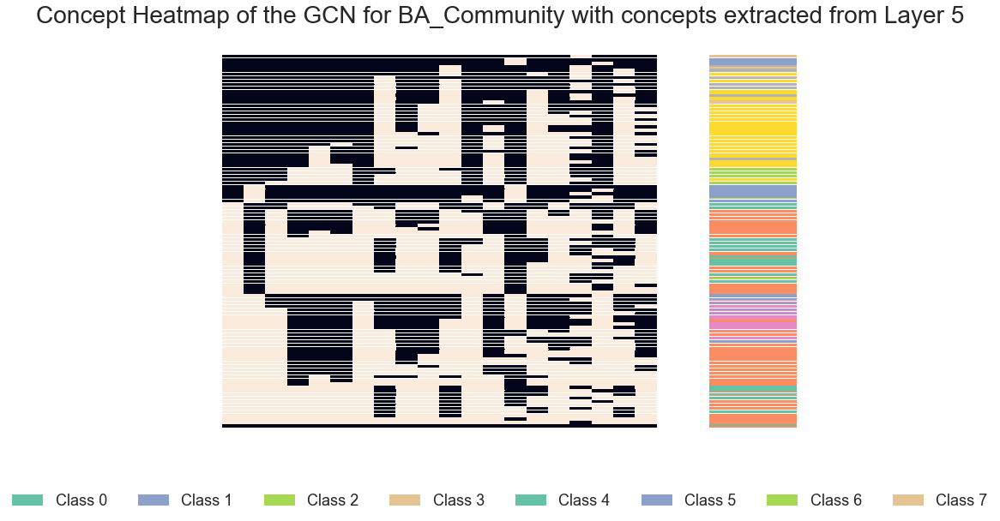

In [6]:
# run multiple times for confidence interval - seeds generated using Google's random number generator
random_seeds = [42, 19, 76, 58, 92]

# load data
G, labels = data_utils.load_syn_data(DATASET_NAME)
data = data_utils.prepare_syn_data(G, labels, TRAIN_TEST_SPLIT, if_adj=False)
    
for seed in random_seeds:
    print("\nSTART EXPERIMENT-----------------------------------------\n")
    seed_everything(seed)
    
    path = os.path.join("..", "output", DATASET_NAME, f"seed_{seed}")
    data_utils.create_path(path)

    run_experiment(data, seed, path)
    
    print("\nEND EXPERIMENT-------------------------------------------\n")